## Portfolio Visualizations
This notebook/dashboard contains accumulates all the graphical analysis detailed in the [Portfolio Analysis](portfolio_analysis.ipynb).  The dashboard comprised of the following tabs with graphs from the portfolio analysis and the Backtesting API.

Dashboard Tabs;

1 Welcome

2 Data Analysis

3 Moving Average Analysis

4 Stock Profitability Analysis

5 Portfolio Returns Analysis

6 Ratios

In [3]:
# for running this code you need to install:
# "pip install backtesting"
# "pip install import_ipynb"


# initial imports
import param
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import plotly.express as px
from pathlib import Path
from dotenv import load_dotenv

# Import Notebook API_Backtesting

import import_ipynb
import API_Backtesting as bt

%matplotlib inline


In [4]:
# Initialize the Panel Extensions (for Plotly)
import panel as pn
pn.extension("plotly")

In [5]:
# Import hvplot.pandas after pn.extension
# This avoids plotly initialization failure
import hvplot.pandas

In [6]:
# Import Backtesting results and plot for sample stock AMZN

back_testing = bt.api_function()
backtest_obj = back_testing.run()
back_plot = pn.pane.Plotly(back_testing.plot())

# Set up backtesting stats dataframe
amnz_stats_df = pd.DataFrame(columns = ["Stock","Start Date", "End Date", "Duration", "Equity Final", "Equity Peak",
                                        "Return", "Sharpe Ratio","Sortino Ratio"])

# Load backtesting results for Amazon
amnz_stats_df = amnz_stats_df.append({'Stock':'AMZN',
                                      'Start Date': backtest_obj['Start'],
                                      'End Date': backtest_obj['End'],
                                      'Duration': backtest_obj['Duration'],
                                      'Equity Final':backtest_obj["Equity Final [$]"],
                                      'Equity Peak':backtest_obj["Equity Peak [$]"],
                                      'Return':backtest_obj["Return [%]"],
                                      'Sharpe Ratio':backtest_obj["Sharpe Ratio"],
                                      'Sortino Ratio':backtest_obj["Sortino Ratio"],
                                       },ignore_index=True)

amnz_stats_df


,Stock,Start Date,End Date,Duration,Equity Final,Equity Peak,Return,Sharpe Ratio,Sortino Ratio
0,AMZN,2015-07-27,2020-07-24,1824 days,16698.819641,17654.270081,66.988196,0.060579,0.124921


## Panel Visualizations: CSV Data Pulls and Dataframe prep

In [7]:
# Read in the profitable stocks from csv
path = Path("resources/profitable_stock.csv")

profitable_portfolio_df = pd.read_csv(path, index_col=0)

# Read in the top 10 profitable stocks csv
top_path = Path("resources/top_profitable_stock.csv")
top_profitable_df = pd.read_csv(top_path)

# Remove the uncessessary columns
top_profitable_df = top_profitable_df.drop(columns=["Unnamed: 0"])


portfolio_close_prices_df = Path("resources/top_prof_stock_prices.csv")

top_prof_stock_prices_df = pd.read_csv(portfolio_close_prices_df, 
                                        index_col="date", 
                                        infer_datetime_format=True, 
                                        parse_dates=True)

# Calculate annualized Sharpe Ratios
sharpe_ratios_data = (top_prof_stock_prices_df.mean() * 252) / (top_prof_stock_prices_df.std() * np.sqrt(252))
sharpe_ratios_df = pd.DataFrame({'Stock':sharpe_ratios_data.index, 'Sharpe Ratio':sharpe_ratios_data.values})

portfolio_daily_returns_df = top_prof_stock_prices_df.pct_change()

# Calculate the portfolio's cumulative returns
portfolio_cumulative_returns_df = (1 + portfolio_daily_returns_df).cumprod() - 1

# Calculate the rolling volatility over a 120 day day window
portfolio_rolling_volatility = portfolio_daily_returns_df.rolling(window=120).std()


# Read in the sample AMNZ moving results csv
amzn_df = Path("resources/sample_moving_amzn.csv")
amzn_df = pd.read_csv(amzn_df)

# Manipulate the original amzn_df using the pd.melt function
amzn_df = pd.melt(amzn_df, id_vars=['date'], value_vars=['close', '50ma', '100ma'])



## Panel Visualizations: Functions

In [8]:
# Create a funtions for data visulizations

def create_hvplot(df, title):
    # Line plot of the hvplot figure 
     hvlineplot = df.hvplot(label=title, legend=True,height=500, width=1000,
                              ylabel='Returns', xlabel='Date')
    
     return hvlineplot

def create_sunburst(df):
    # Sunburst plot of the px figure 
    sunburstplot = px.sunburst(df, path = ["sector", "symbol"],
                                   values = "profit",
                                   #hover_data = ["sector"],
                                   color = "profit",
                                   color_continuous_scale="ice",
                                   title="Profit Distribution of the Top 10 Stocks")
    return sunburstplot

def create_line(df):
    # Line plot of the px figure 
    fig = px.line(df, title="Amazon 50 and 100 Day Moving Avearge", 
                          x='date', y='value', labels = {'date':'Date','value':'Close Price'},
                          color='variable',height=500, width=900)
    fig.update_layout(legend_title_text='Amazon', legend = dict(bgcolor = 'light blue'))
    
    return fig

def create_bar(df):
    # Bar plot of the px figure 
    fig = px.bar(df, x='Stock', y='Sharpe Ratio', 
                 title="Sharpe Ratios for Profitable Portfolio",
                 color='Stock', text='Sharpe Ratio',
                 height=500, width=900)
    
    fig.update_traces(marker_line_color='rgb(8,48,107)',texttemplate='%{text:.2s}', textposition='outside')
    return fig

def create_boxplot(df):
    # Box plot of the px figure
    box_plot = px.box(df["profit"], orientation='h', points='all', 
                                    title="Distribution of SP 500 Stock Profits",
                                    labels = {'variable':'Stock','value':'Profit'})
    
    return box_plot
    
def create_boxplot_pl(df):
    # Box plot of the px figure
    box_plot_pl = px.box(profitable_portfolio_df["profit"], orientation='h', points='all', 
                                    title="Distribution of SP 500 Stock Profit/Loss",
                                    labels = {'variable':'Stock','value':'Profit'},
                                    color_discrete_sequence=["red", "green"],
                                    color=(profitable_portfolio_df['profit'] > 0).map({False: 'Loss',
                                                    True: 'Gain'}),)
    return box_plot_pl

## Dashboard Setup


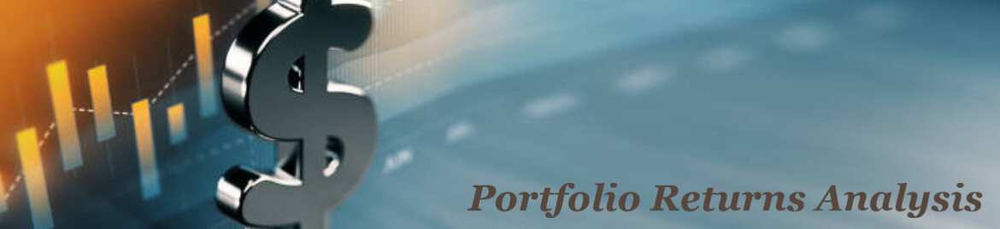
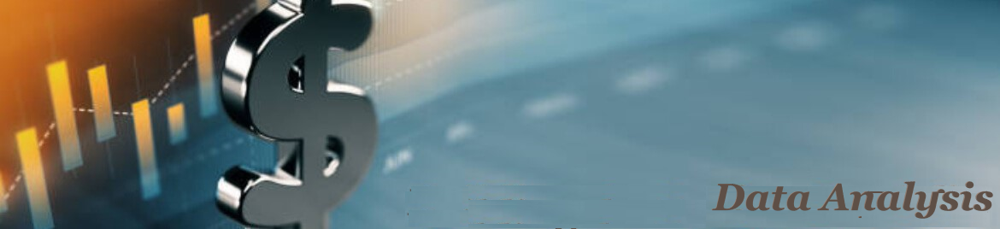
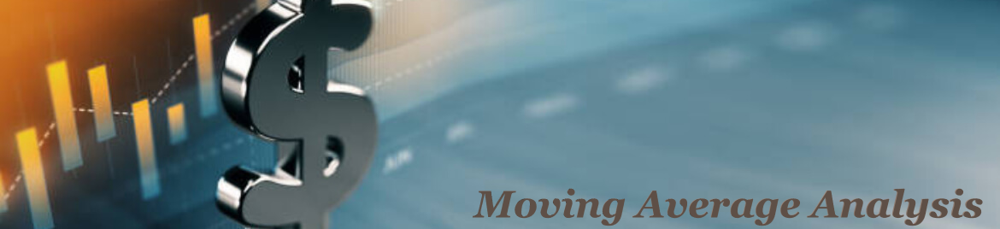
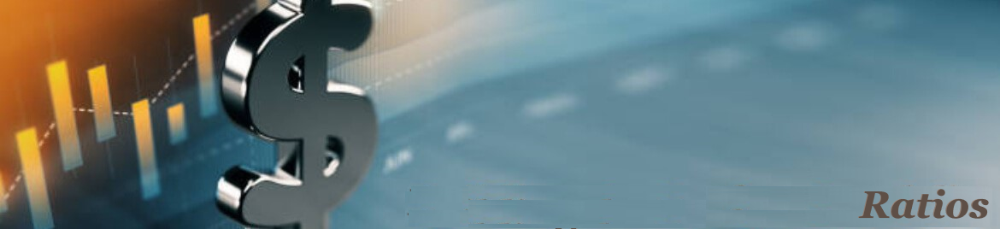
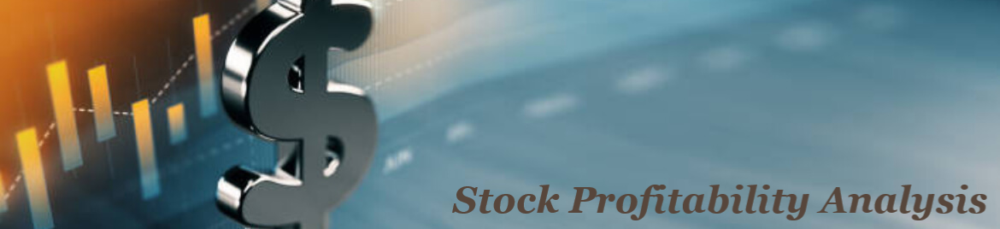
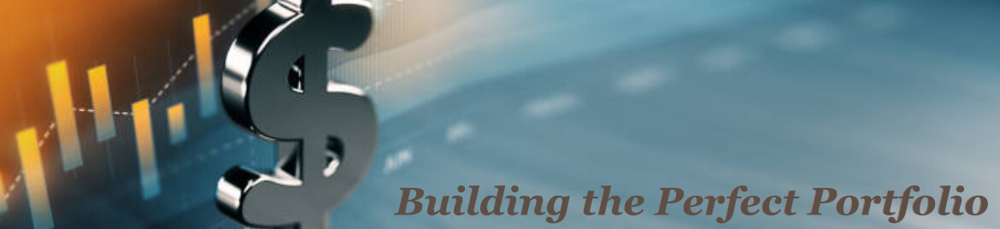

In [11]:
# Dashboard creation:
# Welcome Tab

dash_title = pn.panel("""<h1 style="text-align:center; font-size:20px;color:#8e4a1d;"><b>
                Building a Medium to Long Term Profitable Portfolio</b></h1>""")

# create dashboard description
welcome_desc =pn.panel( """<p style= font-size:16px;color:#3D6782;"><b>
    This dashboard presents a visual analysis of a portfolio containing ten stocks generating 
    the greatest profits from the S&P 500 index. The top ten stock were selected using a 
    Python created trading algorithm focusing on the simple moving average crossover.</b></p>""")


#Create Welcome tab details
welcome_image = pn.panel('images/Tab_1.png',height=220, width=950)

welcome_tab = pn.Column(welcome_image,
                        welcome_desc,
                        create_sunburst(top_profitable_df))
#--------------------------------------------------------------------------------------------------------------------------
# Data Analysis Tab
data_desc =pn.panel( """<p style= font-size:16px;color:#3D6782;"><b>
    For each stock, closing prices were checked for Na values and were dropped.  The profit distribution was checked for outliers 
    and how or if the data was skewed.  Profits are evenly distributed but the project's 
    focus on the stocks with highest profit and the data skew is accepted</b></p>""")

data_image = pn.panel('images/tab_6.png',height=220, width=950)

# Add plots to panels
data_plot = pn.panel(create_boxplot(profitable_portfolio_df))
data_plot_pl = pn.panel(create_boxplot_pl(profitable_portfolio_df))

# Create data analysis tab
data_tab = pn.Column(data_image,
                      data_desc,
                      data_plot,
                      data_plot_pl)
#-------------------------------------------------------------------------------------------------------------------------------
# Moving Average Tab
moving_image = pn.panel('images/tab_2.png',height=220, width=950)

#Create tab description text
moving_desc = pn.panel( """<p style= font-size:16px;color:#3D6782;"><b>
    The simple moving average trading algorithm was used against historical 
    stock trading data from the 500 companies listed on the 
    S&P 500. Closing prices over the previous 5 year were retrieved through the Pandas data reader connecting to Yahoo finance. 
    The resulting profits were calculated based on an intial $1000 investment. Top 10 profitable stocks were selected.
    Amazon results are graphically demonstrated as an example</b></p>""")

moving_html = pn.panel( """<p style= font-size:12px;"font-style: italic;color:#3D6782;">
    <b>A more detailed cross over graphical analysis can be seen at 
    <a href="https://github.com/adgeli/Building_a_Medium_to_Long_Term_Profitable_Portfolio/tree/master/images">
    amzn_plot.html</a></b></p>""")

#Create plot panel
moving_plot_pn = pn.panel(create_line(amzn_df))

#Create moving average tab
moving_tab = pn.Column(moving_image,
                       moving_desc,
                       amnz_stats_df,
                       moving_html,
                       moving_plot_pn)

#--------------------------------------------------------------------------------------------------------------------------
# Profit Tab

# create dashboard title
proft_image = pn.panel('images/tab_3.png',height=220, width=950)
profit_desc =pn.panel( """<p style= font-size:16px;color:#3D6782;"><b>
    Breakdown analysis of Stock profits by sector</b></p>""")

# create a class containing a Sector drop-down, various plots, and a data table output
class profit_tab(param.Parameterized):
    
    # drop down selector widget containing the list of sectors, with the default being 'Financials'
    sector = param.ObjectSelector(default='Financials', objects=list(profitable_portfolio_df.sector.unique()))
    
    # create data set containing only the data applicable to the sector inprofitable_stock_dfthe drop down selector
    def get_data(self):
        class_df = profitable_portfolio_df[(profitable_portfolio_df.sector==self.sector)].copy()
        return class_df
    
    # seaborn box plot for the chosen sector
    def bar_view(self):
        data = self.get_data()
        plot = data.hvplot.bar(x='symbol',y='profit', title="SP 500 Stock Profits by Sector",
                          ylabel='Profits',
                          xlabel='Stock Symbol', 
                          color=(data['profit'] > 0).map({True: 'green',
                                                    False: 'red'}),
                          hover_cols =["symbol", "profit"],
                          height=500, width=1000).opts(xrotation=45,yformatter="%.0f")

        return plot
    
    # table of data for the chosen sector
    def table_view(self):
        data = self.get_data()
        return data

# create an instance of the class
pt = profit_tab(name='')

# create a dashboard, defining the layout as one column containing the
# dashboard title, dashboard description, 'Sector' drop down selector,
# box plot, and data table
profit_col = pn.Column(proft_image,profit_desc,   
                      pt.param,       # 'Sector' drop down selector
                      pt.bar_view,    # bar plot 
                      pt.table_view   # data table
                     )

#-------------------------------------------------------------------------------------------------------------------------------
# Returns Tab

# Create graph titles
ret_title="Profitable Portfolio Returns"
cum_ret_title="Profitable Portfolio Cumulative Returns"
returns_title = '# Portfolio Returns Analysis'
volt_title = "Rolling Portfolio Volatility"

# Tab page infomormation
return_image = pn.panel('images/tab_4.png',height=220, width=950)
return_desc =pn.panel( """<p style= font-size:16px;color:#3D6782;"><b>
    Graphical representation of the returns and cummulative returns</b></p>""")

#Create plot panels
return_volt_pn = pn.panel(create_hvplot(portfolio_rolling_volatility,volt_title))
returns_pn = pn.panel(create_hvplot(portfolio_daily_returns_df,ret_title),linked_axes=False) 
cum_pn = pn.panel(create_hvplot(portfolio_cumulative_returns_df,cum_ret_title),linked_axes=False)

# Create returns tab
returns_tab = pn.Column(return_image,
                        return_desc,
                        returns_pn,
                        cum_pn,
                        return_volt_pn)

#--------------------------------------------------------------------------------------------------------------------------
# Ratio Tab

ratio_image = pn.panel('images/tab_5.png',height=220, width=950)
ratio_desc =pn.panel( """<p style= font-size:16px;color:#3D6782;"><b>
    Graphical representation of the Sharpe Ratio</b></p>""")

#Dataframe with Sharpe and Sortino Ratios
ratio_pn = pn.panel(pd.DataFrame(index =['Profitable Portfolio'],data = {"Sharp Ratio":[-3.5811413649780466],
                                                                         "Sortino Ration":[ -6.202279181522641]}))
# create plot panel
ratio_plot_pn = pn.panel(create_bar(sharpe_ratios_df))

# Create ratio tab
ratio_tab = pn.Column(ratio_image,
                      ratio_desc,
                      ratio_pn,
                      create_bar(sharpe_ratios_df)) 
#--------------------------------------------------------------------------------------------------------------------------
# Create a tab layout for the dashboard

#Create the main dashboard
tabs = pn.Tabs(("Welcome",welcome_tab),
               ("Data Analysis", data_tab),
               ("Moving Average Analysis", moving_tab),
               ("Stock Profitability Analysis", profit_col),
               ("Portfolio Returns Analysis",returns_tab),
               ("Ratios", ratio_tab))

dashboard = pn.Column(dash_title,tabs)

# show the dashboard with the data embedded 
# (for using in an html download of the notebook so that 
# no 'callback' is required from the browser to get the data)
# show the dashboard with the data embedded 
# (for using in an html download of the notebook so that 
# no 'callback' is required from the browser to get the data)

dashboard.embed(max_opts = 5)

## Serve the Panel Dashboard

In [12]:
dashboard.servable()
dashboard.show()

Launching server at http://localhost:54513
